# Collecting data from TOI Website - Web Scraping

Once this part is executed, you should have a good corpos of most recent news data from the top states of india ["hyderabad", "bangalore", "chennai", "mumbai", "delhi", "pune", "kolkata"]. You can add more cities if you want in the variables LIST_OF_CITIES and increase the PAGINATION_UPTO variables for going older into the TOI website.

⚠️🔴 **WORD OF CAUTION**: This web scraping was done for educational purpose and should not be used for purposes other than that.

In [1]:
!pip install requests bs4

In [1]:
import requests as req
from bs4 import BeautifulSoup as bs
import pandas as pd
news_data = pd.DataFrame(columns = ["text"])

In [2]:
def get_article_text(url):
  soup = bs(req.get(url).content, 'html.parser')
  all_divs = soup.find_all("div")
  correct_div = None
  for div in all_divs:
    if div.has_attr("data-articlebody"):
      correct_div = div
      break
  if correct_div is None:
    return ""
  return correct_div.getText()

In [3]:
BASE_URL = "https://timesofindia.indiatimes.com/city/"
LIST_OF_CITIES = ["hyderabad", "bangalore", "chennai", "mumbai", "delhi", "pune", "kolkata"]
PAGINATION_UPTO = 5

def prepare_links():
  links = []
  for city in LIST_OF_CITIES:
    for page in range(1, PAGINATION_UPTO+1):
      links.append(BASE_URL + city + "/" + str(page))
  return links
all_links = prepare_links()

In [4]:
def find_articleshow_links(URL):
  articleshow_links = []
  soup = bs(req.get(URL).content, 'html.parser')
  all_links = soup.find_all("a")
  for link in all_links:
    if "articleshow" in link.get("href"):
      articleshow_links.append(link.get("href"))
  return articleshow_links

In [5]:
CHUNK_SIZE = 100
CHUNKS = []

for link in all_links:
  city = link.split("/")[-2]
  page = link.split("/")[-1]
  print(city, page)
  article_show_links = find_articleshow_links(link)
  for link in article_show_links:
    CHUNKS.append(get_article_text(link))
    if len(CHUNKS) == CHUNK_SIZE:
      news_data =pd.concat((news_data, pd.DataFrame({"text":CHUNKS})))
      news_data.to_csv("news.csv")
      CHUNKS = []
if len(CHUNKS) > 0:
  news_data =pd.concat((news_data, pd.DataFrame({"text":CHUNKS})))
  news_data.to_csv("news.csv")
  CHUNKS = []
news_data.to_csv("news.csv")

hyderabad 1
hyderabad 2
hyderabad 3
hyderabad 4
hyderabad 5
bangalore 1
bangalore 2
bangalore 3
bangalore 4
bangalore 5
chennai 1
chennai 2
chennai 3
chennai 4
chennai 5
mumbai 1
mumbai 2
mumbai 3
mumbai 4
mumbai 5
delhi 1
delhi 2
delhi 3
delhi 4
delhi 5
pune 1
pune 2
pune 3
pune 4
pune 5
kolkata 1
kolkata 2
kolkata 3
kolkata 4
kolkata 5


In [7]:
news_data.shape

(2904, 1)

# Building model using Top2Vec.

In [8]:
!pip install --upgrade top2vec
!pip install top2vec[sentence_encoders]
!pip install wordcloud matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 44.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 6.2 MB/s eta 0:00:00
  Attempting uninstall: cython
    Found existing installation: Cython 3.0.10
    Uninstalling Cython-3.0.10:
      Successfully uninstalled Cython-3.0.10
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.6/590.6 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 93.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 83.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 89.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 39.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 347.

In [9]:

import pandas as pd
from top2vec import Top2Vec
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [10]:
df = pd.read_csv('news.csv', usecols=['text'])
df.dropna(subset=['text'], inplace=True)
documents = df['text'].tolist()

In [12]:
df.shape

(2863, 1)

In [13]:
# remove empty strings
documents = [doc for doc in documents if doc != '']

In [14]:
len(documents)

2863

In [15]:
nltk.download('stopwords')

english_stopwords = set(stopwords.words('english'))

def remove_stopwords(text):
    return ' '.join([word for word in text.split() if word not in english_stopwords])

documents = [remove_stopwords(doc) for doc in documents]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [16]:
print("Creating Top2Vec model...")
top2vec_model = Top2Vec(documents, embedding_model="universal-sentence-encoder", workers = 2)
print("Top2Vec model created.")

2024-07-09 09:22:22,613 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training


Creating Top2Vec model...


/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2024-07-09 09:22:31,206 - top2vec - INFO - Downloading universal-sentence-encoder model
INFO:top2vec:Downloading universal-sentence-encoder model
2024-07-09 09:23:24,501 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-07-09 09:23:41,788 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-07-09 09:24:26,650 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-07-09 09:24:26,894 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


Top2Vec model created.


# Creating the Word Cloud of Topics

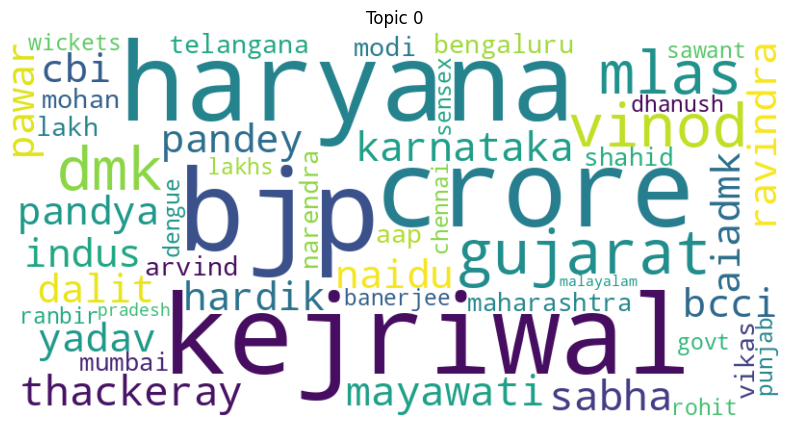

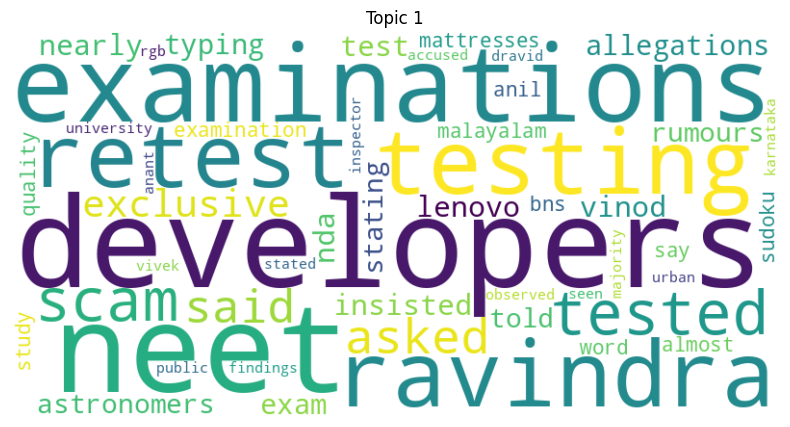

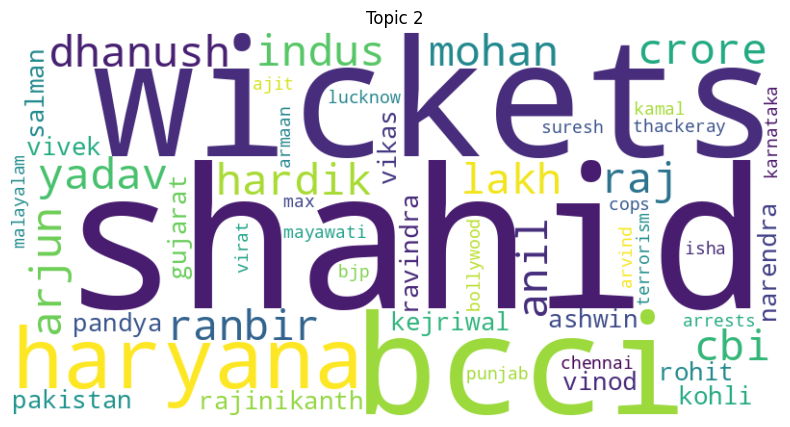

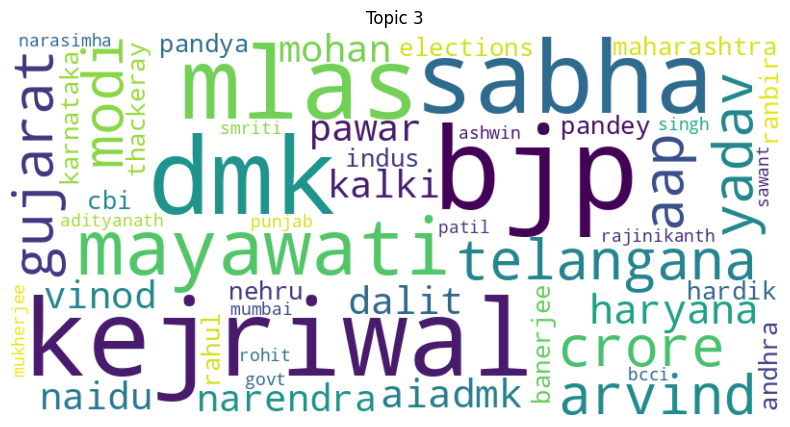

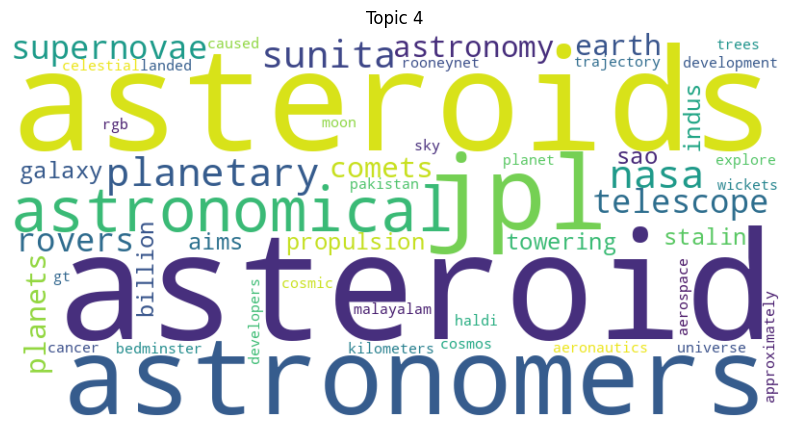

...

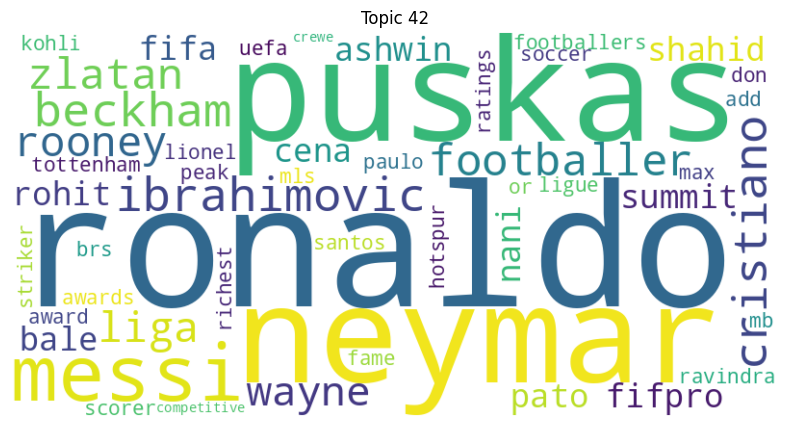

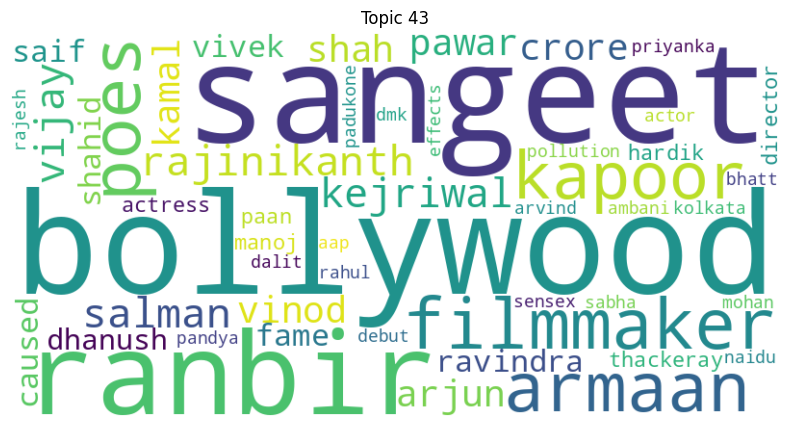

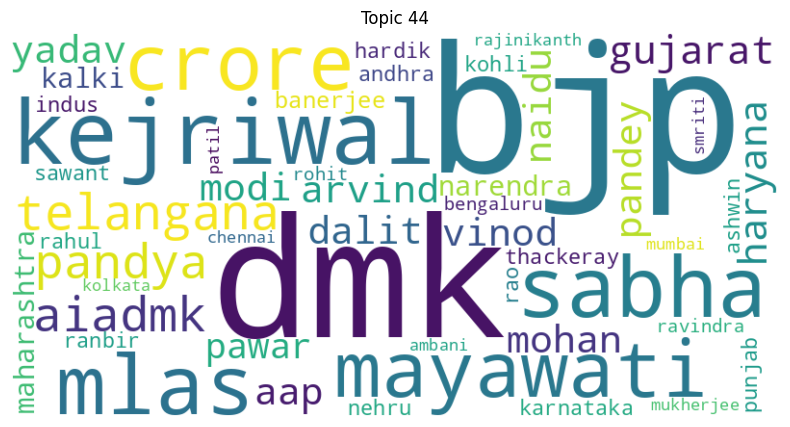

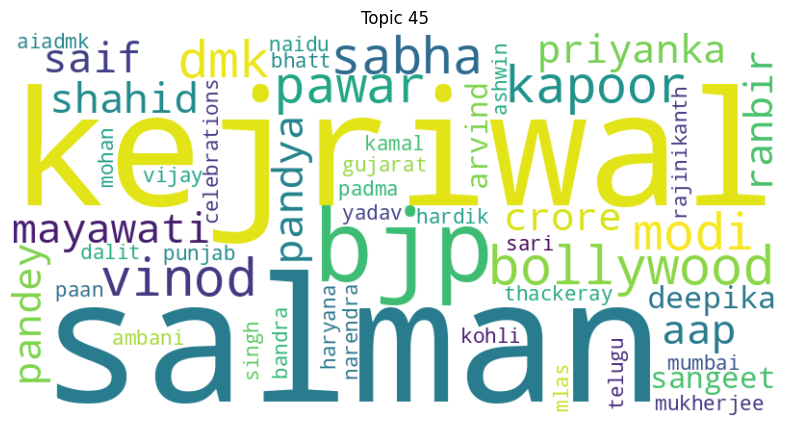

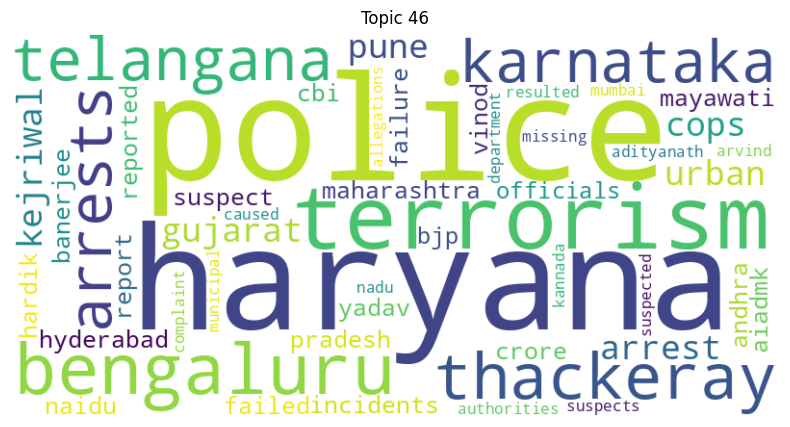

In [17]:
topic_words, word_scores, topic_nums = top2vec_model.get_topics()
for topic_num in topic_nums:
    words = topic_words[topic_num]
    word_freq = {word: score for word, score in zip(words, word_scores[topic_num])}

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', max_words=50).generate_from_frequencies(word_freq)

    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Topic {topic_num}")
    plt.axis("off")
    plt.show()

# Creating Louvian Chart

In [18]:
!pip install networkx python-louvain

In [19]:
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx
from community import community_louvain

In [20]:
G = nx.Graph()
topic_vectors = top2vec_model.topic_vectors
num_topics = len(topic_vectors)
similarity_matrix = cosine_similarity(topic_vectors)

for i in range(num_topics):
    G.add_node(i)

threshold = 0.5
for i in range(num_topics):
    for j in range(i + 1, num_topics):
        if similarity_matrix[i][j] > threshold:
            G.add_edge(i, j, weight=similarity_matrix[i][j])

In [21]:
topic_words, _, _ = top2vec_model.get_topics()
representative_words = {i: topic_words[i][0] for i in range(num_topics)}

In [22]:
partition = community_louvain.best_partition(G)
pos = nx.spring_layout(G)
colors = [partition[node] for node in G.nodes()]

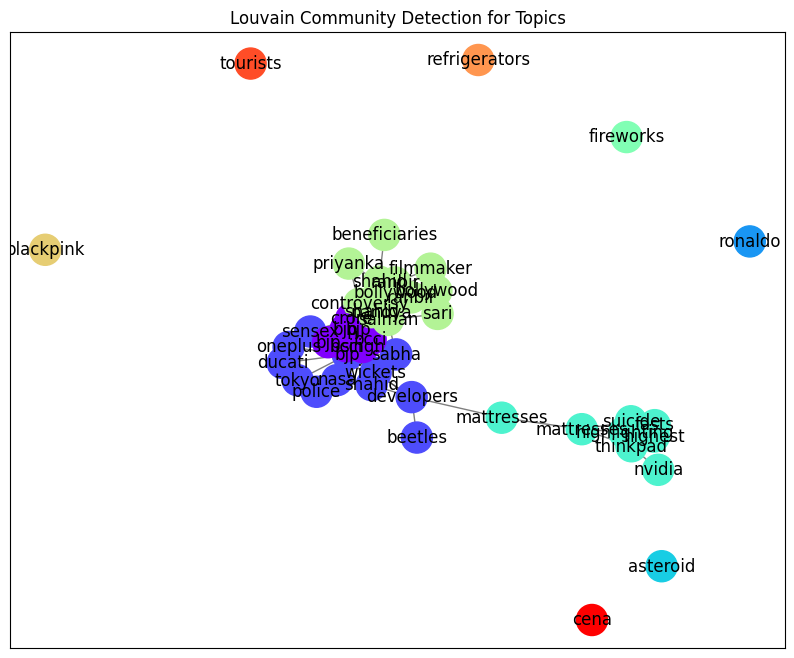

In [23]:
plt.figure(figsize=(10, 8))
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=colors, cmap=plt.cm.rainbow)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, labels=representative_words, font_size=12)
plt.title("Louvain Community Detection for Topics")
plt.show()